# EE 353

# Assignment 4 : Unsupervised Learning

<p float="right">Pranav Prakash - 22B3945<p>

[Link to submission video](https://drive.google.com/drive/folders/1aNgWOAtamdFRgI-enyB1PIpVytzzsKGV?usp=sharing)

Disclosure:  
Comments and docstrings added by _[0]_  

## Data Pre-processing

We start off by importing all the libraries used going forward (these have been moved up into one place).

1. **`numpy`**: Efficient numerical operations for arrays and matrices.  
2. **`pandas`**: Data manipulation and preprocessing with ease.  
3. **`matplotlib.pyplot`**: Plotting and visualizing data.  
4. **`seaborn`**: Enhanced statistical data visualization.  
5. **`sklearn.preprocessing`**: Standardization and transformations for machine learning readiness.  
6. **`sklearn.decomposition`**: Dimensionality reduction (e.g., PCA).  
7. **`sklearn.cluster`**: Clustering algorithms (e.g., KMeans, DBSCAN).  
8. **`sklearn.manifold`**: t-SNE for visualizing high-dimensional data in 2D/3D.  
9. **`sklearn.metrics`**: Error metrics (e.g., Mean Squared Error).  
10. **`scipy.stats`**: Statistical functions and analysis.  
11. **`kneed`**: Identifying the "elbow" in curve-based optimizations (e.g., KMeans clustering).  

*Generated via AI : [1]*


In [126]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, PowerTransformer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN
from sklearn.manifold import TSNE
from sklearn.metrics import mean_squared_error
import scipy.stats as stats
from kneed import KneeLocator

Then we load the dataset.

In [127]:
data = pd.read_csv('Customer-Data - 2.csv')
display(data.head())
display(data.describe())
display(data.info()) # Includes info on the data types of each column
display(data.nunique()) # Number of unique values in each column
print(data.isnull().sum()[data.isnull().any()]) # Number of missing values in each column


,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204822,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634780,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

None

CUST_ID                             8950
BALANCE                             8871
BALANCE_FREQUENCY                     43
PURCHASES                           6203
ONEOFF_PURCHASES                    4014
INSTALLMENTS_PURCHASES              4452
CASH_ADVANCE                        4323
PURCHASES_FREQUENCY                   47
ONEOFF_PURCHASES_FREQUENCY            47
PURCHASES_INSTALLMENTS_FREQUENCY      47
CASH_ADVANCE_FREQUENCY                54
CASH_ADVANCE_TRX                      65
PURCHASES_TRX                        173
CREDIT_LIMIT                         205
PAYMENTS                            8711
MINIMUM_PAYMENTS                    8636
PRC_FULL_PAYMENT                      47
TENURE                                 7
dtype: int64

CREDIT_LIMIT          1
MINIMUM_PAYMENTS    313
dtype: int64


### Data Preprocessing Steps

1. **Drop Irrelevant Columns**:
   - Removed the `CUST_ID` column as it is not relevant for analysis.

2. **Handle Missing Values**:
   - Imputed missing values in `CREDIT_LIMIT` and `MINIMUM_PAYMENTS` with their respective column means.

3. **Correlation Analysis**:
   - Computed the correlation matrix to identify relationships between features.
   - Visualized the correlation matrix using a heatmap for better readability.

4. **Feature Selection**:
   - Identified highly correlated feature pairs with a correlation threshold > 0.9.
   - Dropped one feature from each highly correlated pair to reduce redundancy.

5. **Visualization Before Transformation**:
   - Displayed histograms for each feature to understand their distributions.
   - Used pairwise plots to explore relationships between features before transformation.


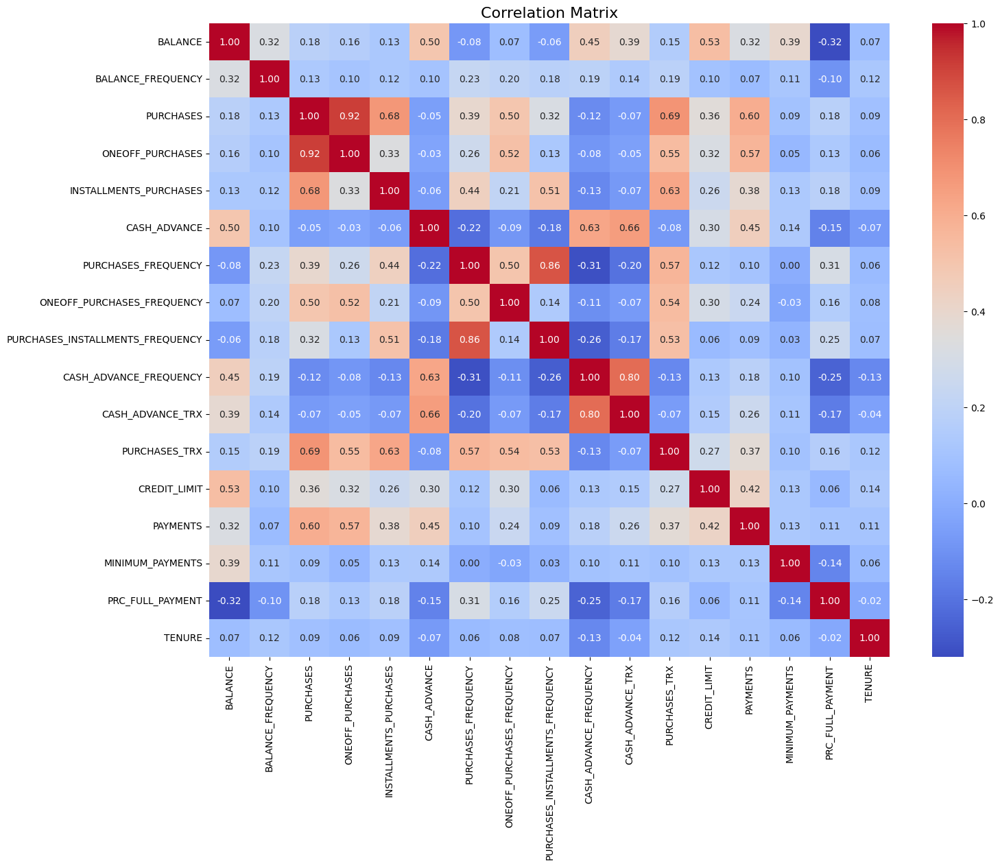

Highly correlated feature pairs (Threshold > 0.9): [('PURCHASES', 'ONEOFF_PURCHASES')]
Dropping features due to high correlation: {'ONEOFF_PURCHASES'}


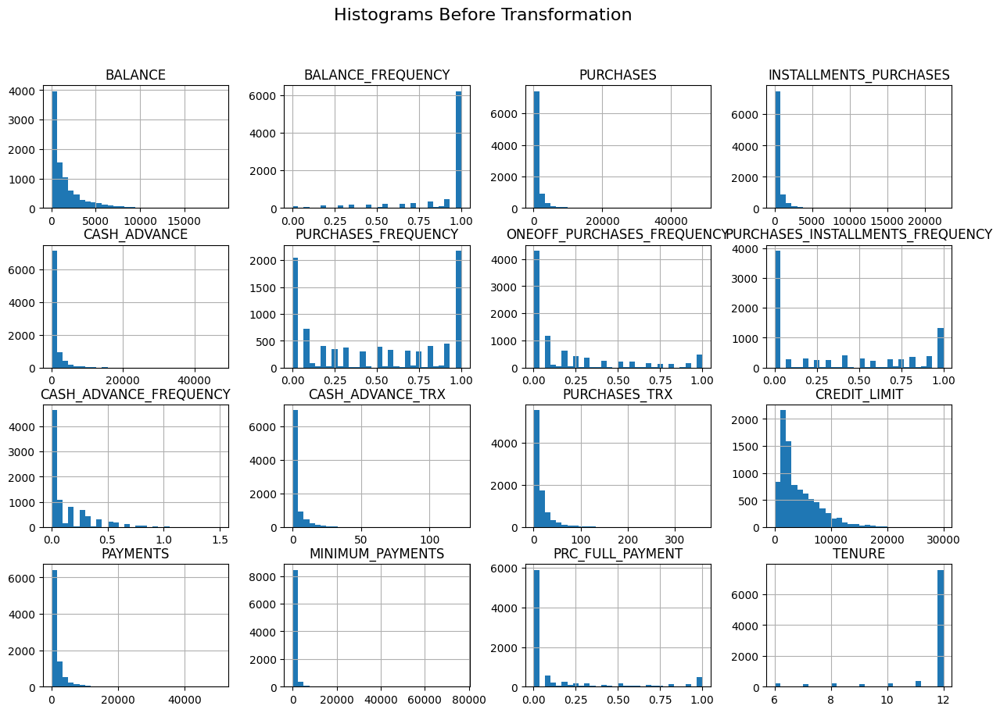

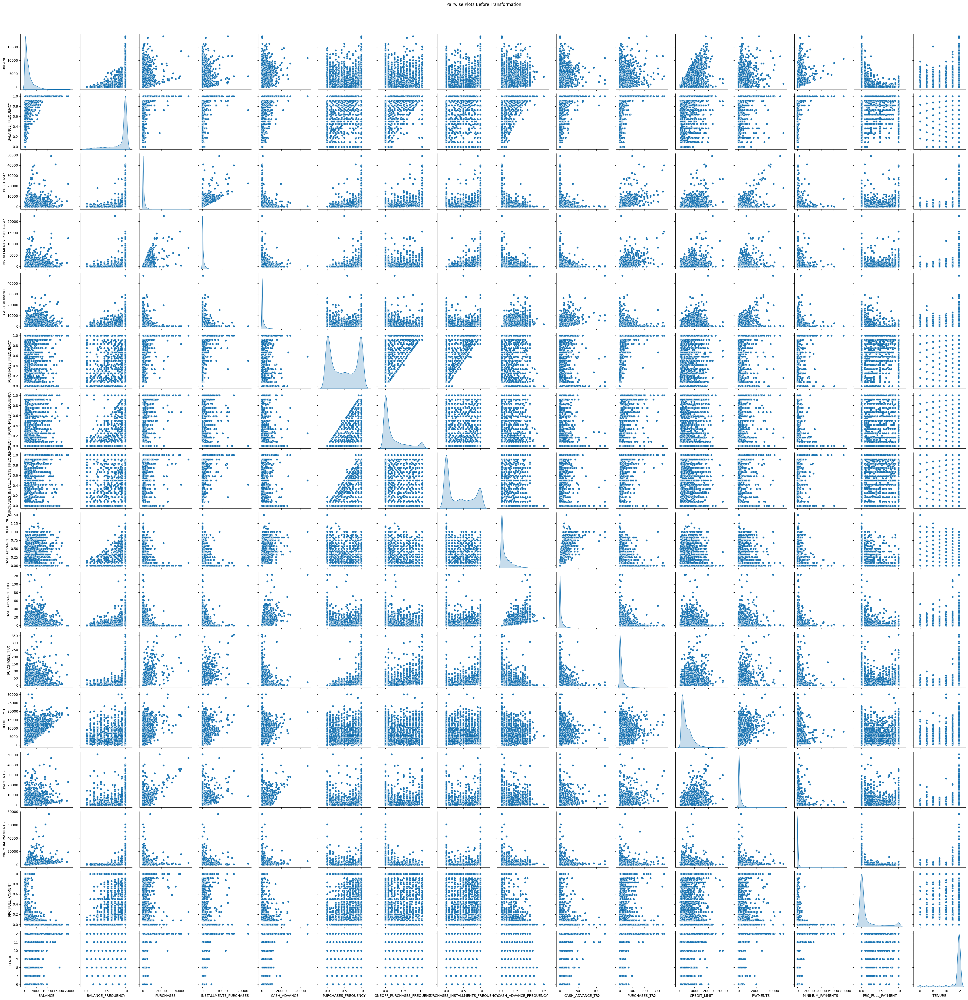

In [128]:

# Generated from [2]
# Drop the 'CUST_ID' column as it is irrelevant for analysis
data = data.drop(columns=['CUST_ID'])

# Handle missing values by imputing with the mean
data['CREDIT_LIMIT'] = data['CREDIT_LIMIT'].fillna(data['CREDIT_LIMIT'].mean())
data['MINIMUM_PAYMENTS'] = data['MINIMUM_PAYMENTS'].fillna(data['MINIMUM_PAYMENTS'].mean())

# Compute correlation matrix before transformations
corr_matrix = data.corr()

plt.figure(figsize=(16, 12))  # Set the figure size for better readability
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation Matrix", fontsize=16)
plt.show()

# Drop highly correlated features based on a threshold
threshold = 0.9
high_corr = np.where(corr_matrix > threshold)
high_corr_pairs = [(corr_matrix.index[i], corr_matrix.columns[j]) 
                   for i, j in zip(*high_corr) if i != j and i < j]
print(f"Highly correlated feature pairs (Threshold > {threshold}): {high_corr_pairs}")

# Drop one feature from each highly correlated pair
features_to_drop = set(pair[1] for pair in high_corr_pairs)
print(f"Dropping features due to high correlation: {features_to_drop}")
data_dropped = data.drop(columns=list(features_to_drop))

# Display histograms for each column before transformation
data_dropped.hist(bins=30, figsize=(15, 10))
plt.suptitle('Histograms Before Transformation', fontsize=16)
plt.show()

# Display pairwise plots before and after transformation
sns.pairplot(data_dropped, diag_kind='kde')
plt.suptitle('Pairwise Plots Before Transformation', y=1.02)
plt.show()

To stabilize variance and make data more Gaussian-like, we apply `PowerTransformer`, which adjusts skewness and handles zero/negative values effectively.

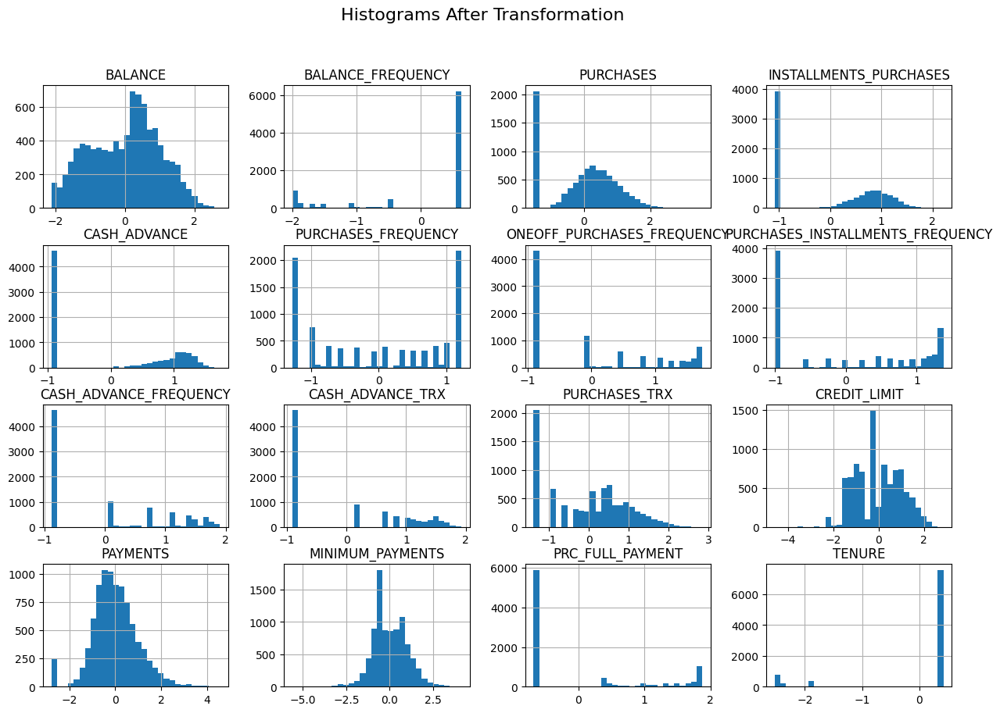

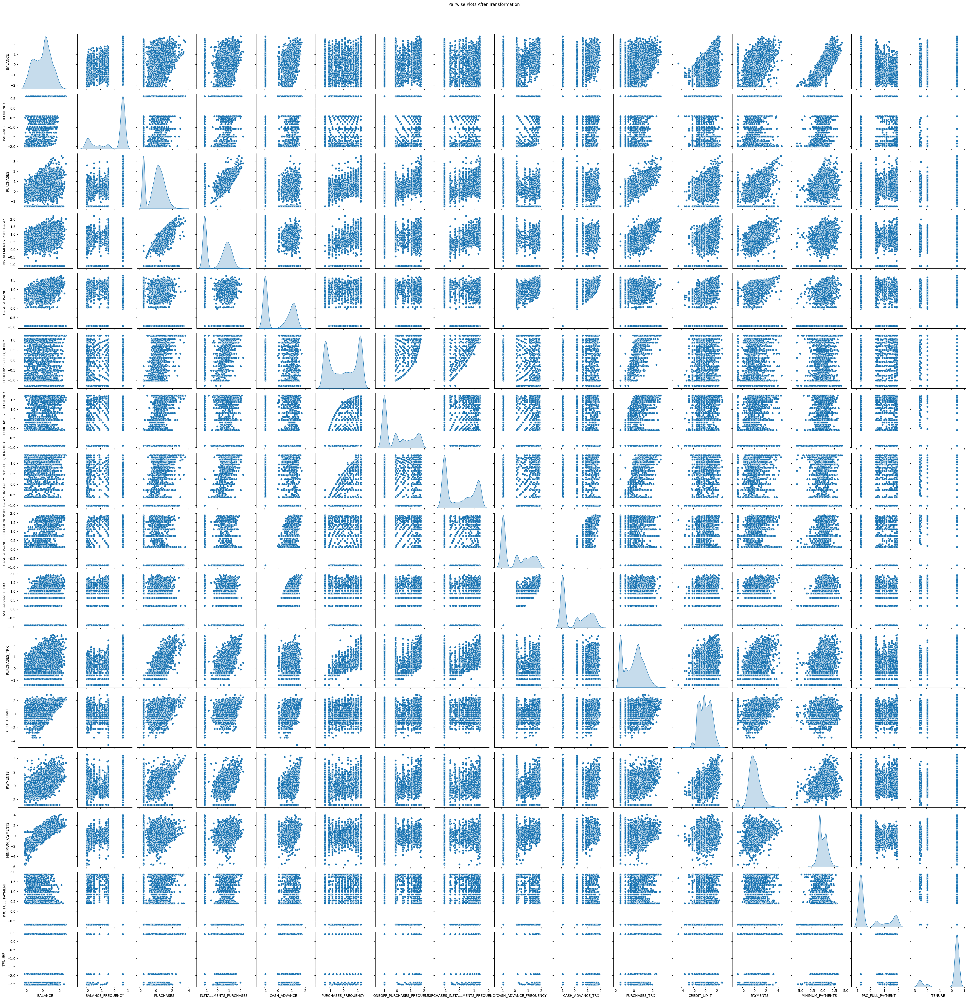

In [129]:
# Suggestions from [3]
# Apply PowerTransformer for transformations
transformer = PowerTransformer(method='yeo-johnson')  # Handles zero/negative values
transformed_data = transformer.fit_transform(data_dropped)

# Create a DataFrame for transformed data
transformed_df = pd.DataFrame(transformed_data, columns=data_dropped.columns)

# Display histograms for each column after transformation
transformed_df.hist(bins=30, figsize=(15, 10))
plt.suptitle('Histograms After Transformation', fontsize=16)
plt.show()

sns.pairplot(transformed_df, diag_kind='kde')
plt.suptitle('Pairwise Plots After Transformation', y=1.02)
plt.show()

Since `TENURE` has almost 90% of values concentrated to 1 value, we drop it.

In [130]:
transformed_df = transformed_df.drop(columns=['TENURE'])

## Clustering

### k-means

The optimal number of clusters based on the elbow method is: 4


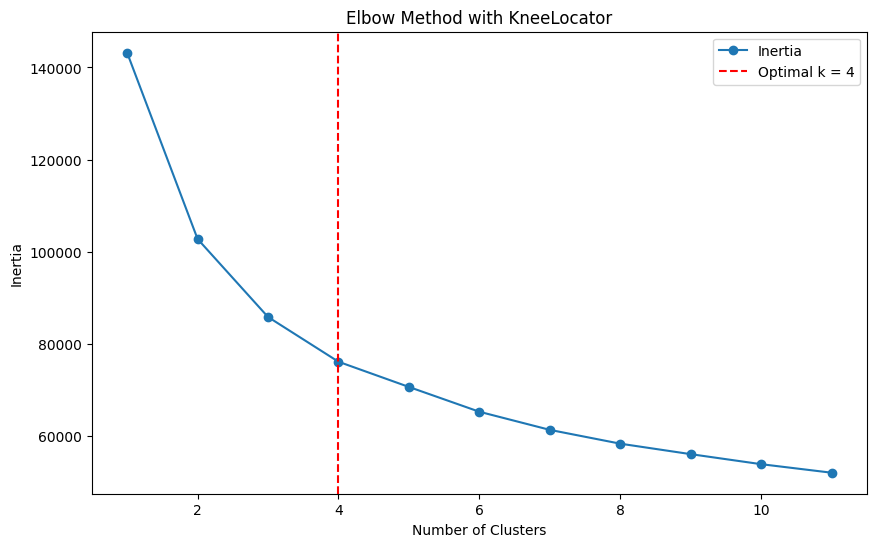

In [131]:
# Determine the optimal number of clusters using the elbow method
inertia = []
k_values = range(1, 12)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(transformed_data)
    inertia.append(kmeans.inertia_)

# Suggestions from [4]
# Use KneeLocator to find the "elbow" point
k1 = KneeLocator(k_values, inertia, curve="convex", direction="decreasing")
optimal_k = k1.elbow
print(f"The optimal number of clusters based on the elbow method is: {optimal_k}")

# Plot the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(k_values, inertia, marker='o', label="Inertia")
plt.axvline(x=optimal_k, color='r', linestyle='--', label=f"Optimal k = {optimal_k}")
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.title("Elbow Method with KneeLocator")
plt.legend()
plt.show()

# Train KMeans with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
labels_df = pd.DataFrame(kmeans.fit_predict(transformed_data), columns=['kmeans_labels'])

### DBSCAN

To find the optimal DBSCAN parameters, we perform a grid search over `eps` and `min_samples`, record configurations yielding exactly 4 clusters, and sort by the number of noise points. We use this as a kind of objective.


In [132]:
# Generated from [5]
from itertools import product

# Define parameter ranges
eps_values = np.linspace(1.8, 2.0, 21)  # 21 values between 1 and 3
min_samples_values = range(20, 100, 10)  # 20 to 200 in steps of 10

# Store results
results = []

# Grid search over eps and min_samples
for eps, min_samples in product(eps_values, min_samples_values):
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    labels = dbscan.fit_predict(transformed_data)
    
    # Count clusters and noise points
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise = list(labels).count(-1)
    
    # Only consider results with exactly 4 clusters
    if n_clusters == 4:
        results.append({
            'eps': eps,
            'min_samples': min_samples,
            'n_noise': n_noise
        })

# Convert results to DataFrame and sort by noise points (ascending)
results_df = pd.DataFrame(results).sort_values(by='n_noise', ascending=True)

# Display the top 10 results
print("Top 10 parameter pairs with 4 clusters and minimal noise:")
print(results_df.head(10))


Top 10 parameter pairs with 4 clusters and minimal noise:
     eps  min_samples  n_noise
26  1.95           30      961
25  1.94           30      984
24  1.93           30     1018
23  1.92           30     1036
22  1.91           30     1054
21  1.90           30     1070
5   1.81           30     1289
0   1.80           30     1325
17  1.85           40     1434
15  1.84           40     1460


Number of clusters (excluding noise): 5
Number of noise points: 961
Cluster sizes:
dbscan_labels
-1     961
 0    7199
 1     467
 2     279
 3      44
Name: count, dtype: int64


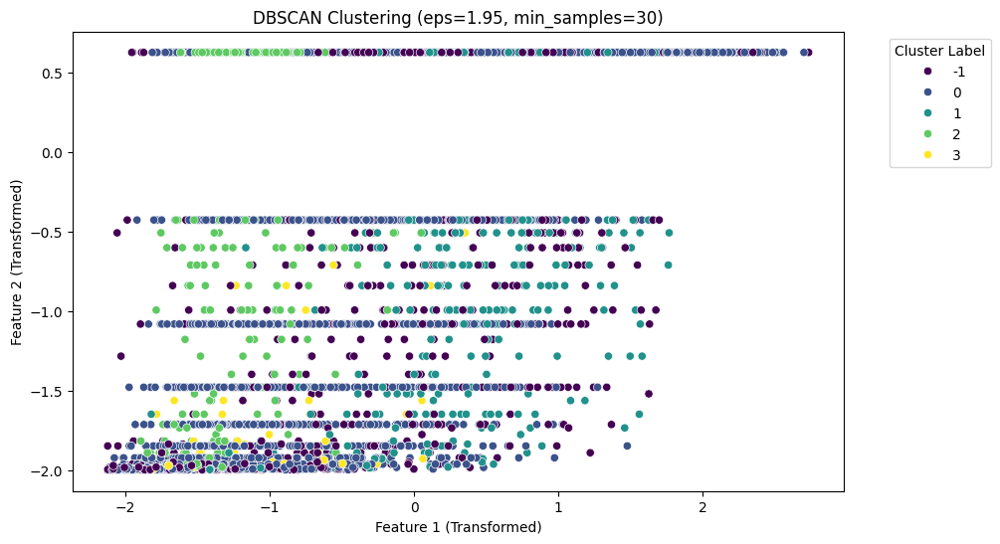

In [133]:
eps = 1.95
min_samples = 30
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
labels_df['dbscan_labels'] = dbscan.fit_predict(transformed_data)

# Analyze DBSCAN results
n_clusters = len(set(labels_df['dbscan_labels'])) - (1 if -1 in labels_df['dbscan_labels'] else 0)  # Exclude noise (-1)
n_noise = list(labels_df['dbscan_labels']).count(-1)  # Count noise points
cluster_sizes = labels_df['dbscan_labels'].value_counts().sort_index()

print(f"Number of clusters (excluding noise): {n_clusters}")
print(f"Number of noise points: {n_noise}")
print(f"Cluster sizes:\n{cluster_sizes}")

# Visualize DBSCAN results
plt.figure(figsize=(10, 6))
sns.scatterplot(x=transformed_data[:, 0], y=transformed_data[:, 1], hue=labels_df['dbscan_labels'], palette="viridis")
plt.title(f'DBSCAN Clustering (eps={eps}, min_samples={min_samples})')
plt.xlabel('Feature 1 (Transformed)')
plt.ylabel('Feature 2 (Transformed)')
plt.legend(title='Cluster Label', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


### TSNE Visualization

In [134]:
tsne = TSNE(n_components=2, random_state=42)
tsne_embedding = tsne.fit_transform(transformed_data)

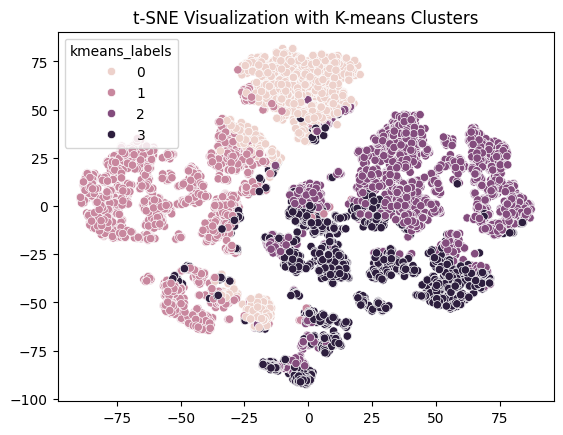

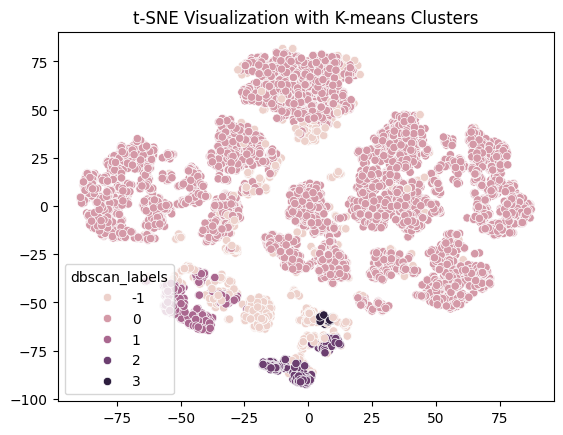

In [135]:
# Visualize t-SNE with K-means clusters
sns.scatterplot(x=tsne_embedding[:, 0], y=tsne_embedding[:, 1], hue=labels_df['kmeans_labels'])
plt.title('t-SNE Visualization with K-means Clusters')
plt.show()

# Visualize t-SNE with DB-SCAN clusters
sns.scatterplot(x=tsne_embedding[:, 0], y=tsne_embedding[:, 1], hue=labels_df['dbscan_labels'])
plt.title('t-SNE Visualization with K-means Clusters')
plt.show()

### Cluster Analysis & Naming

To analyze the characteristics of each cluster, we separate them based on label and record and plot their statistics.

Analyzing and plotting K-means clusters as subplots...


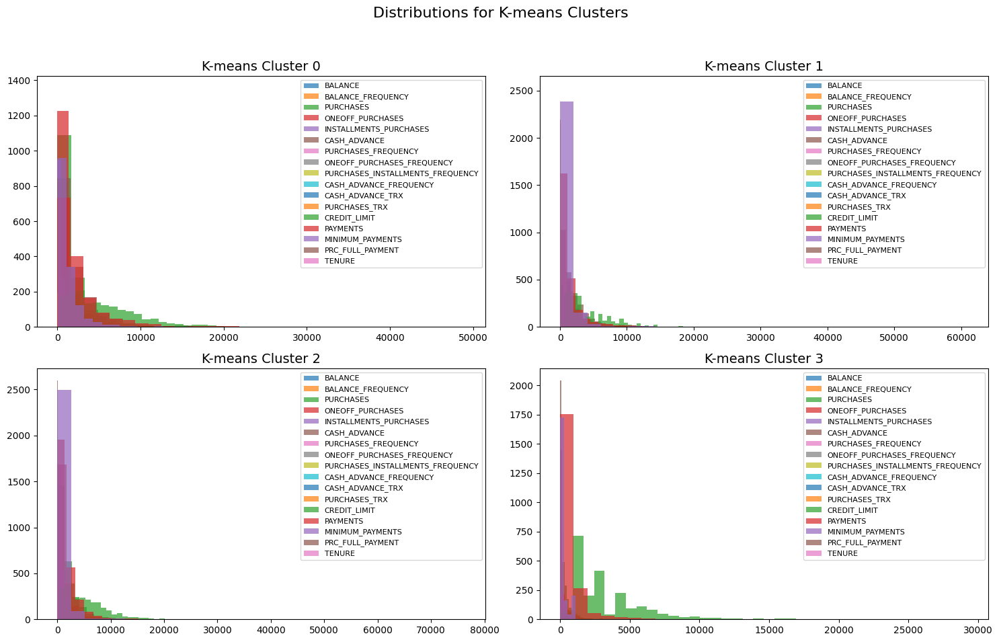

Analyzing and plotting DBSCAN clusters as subplots...


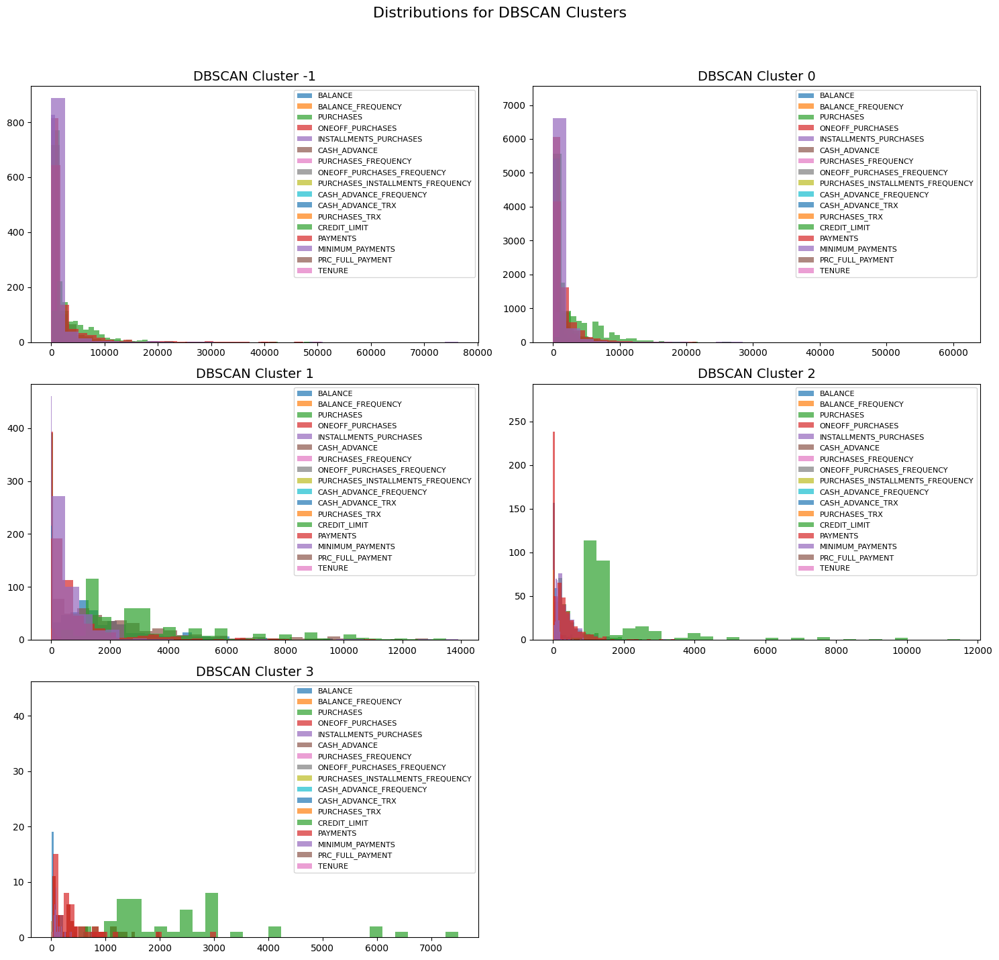

In [136]:
# Simplification by [6]
# Function to analyze and plot clusters with subplots
def analyze_and_plot_clusters_with_subplots(data, labels, method_name):
    unique_clusters = np.unique(labels)
    cluster_summary = {}
    
    n_clusters = len(unique_clusters)
    n_cols = 2  # Define the number of columns for the subplot grid
    n_rows = (n_clusters + n_cols - 1) // n_cols  # Calculate rows based on the number of clusters
    
    # Create a figure for subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
    axes = axes.flatten()  # Flatten the axes array for easy indexing
    
    for idx, cluster in enumerate(unique_clusters):
        # Filter data for the current cluster
        cluster_data = data[labels == cluster]
        
        # Compute descriptive statistics
        summary_stats = cluster_data.describe().T
        cluster_summary[cluster] = summary_stats
        
        # Plot histograms for each feature in the cluster
        for column in cluster_data.columns:
            axes[idx].hist(cluster_data[column], bins=30, alpha=0.7, label=column)
        
        axes[idx].set_title(f'{method_name} Cluster {cluster}', fontsize=14)
        axes[idx].legend(loc='upper right', fontsize=8)
    
    # Remove any unused subplots
    for ax in axes[n_clusters:]:
        fig.delaxes(ax)
    
    plt.suptitle(f'Distributions for {method_name} Clusters', fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to fit the title
    plt.show()
    
    return cluster_summary

# Analyze and plot K-means clusters
print("Analyzing and plotting K-means clusters as subplots...")
kmeans_summary = analyze_and_plot_clusters_with_subplots(data, labels_df['kmeans_labels'], "K-means")

# Analyze and plot DBSCAN clusters
print("Analyzing and plotting DBSCAN clusters as subplots...")
dbscan_summary = analyze_and_plot_clusters_with_subplots(data, labels_df['dbscan_labels'], "DBSCAN")


In [137]:
display(kmeans_summary)
display(dbscan_summary)

{0:                                    count         mean          std  \
 BALANCE                           1543.0  3020.346479  2657.062931   
 BALANCE_FREQUENCY                 1543.0     0.977543     0.073683   
 PURCHASES                         1543.0  1577.436118  2349.908894   
 ONEOFF_PURCHASES                  1543.0   951.140181  1897.268963   
 INSTALLMENTS_PURCHASES            1543.0   626.503979   981.712770   
 CASH_ADVANCE                      1543.0  2282.971478  3040.387413   
 PURCHASES_FREQUENCY               1543.0     0.735070     0.260829   
 ONEOFF_PURCHASES_FREQUENCY        1543.0     0.327541     0.309000   
 PURCHASES_INSTALLMENTS_FREQUENCY  1543.0     0.544564     0.359812   
 CASH_ADVANCE_FREQUENCY            1543.0     0.301971     0.215945   
 CASH_ADVANCE_TRX                  1543.0     7.771225     9.428557   
 PURCHASES_TRX                     1543.0    24.307194    27.843392   
 CREDIT_LIMIT                      1543.0  5594.180169  4037.156232   
 PA

{-1:                                   count         mean          std        min  \
 BALANCE                           961.0  1384.737816  2162.032673   0.000000   
 BALANCE_FREQUENCY                 961.0     0.760023     0.297402   0.000000   
 PURCHASES                         961.0  1373.148564  3394.004370   0.000000   
 ONEOFF_PURCHASES                  961.0   922.438241  2786.105317   0.000000   
 INSTALLMENTS_PURCHASES            961.0   451.029729  1457.326983   0.000000   
 CASH_ADVANCE                      961.0  1488.403693  3204.147147   0.000000   
 PURCHASES_FREQUENCY               961.0     0.495215     0.362763   0.000000   
 ONEOFF_PURCHASES_FREQUENCY        961.0     0.246661     0.290575   0.000000   
 PURCHASES_INSTALLMENTS_FREQUENCY  961.0     0.300579     0.352718   0.000000   
 CASH_ADVANCE_FREQUENCY            961.0     0.167639     0.210362   0.000000   
 CASH_ADVANCE_TRX                  961.0     4.156087     8.623284   0.000000   
 PURCHASES_TRX          

Giving these statistics to ChatGPT _[8]_ , gave the following conclusions:

#### **K-Means Clusters**:

1. **Cluster 0: Premium Credit Users**
   - **Description**: Customers with high balances and frequent purchases, often using installment and cash advance options. Represent high-value customers with extensive credit usage.

2. **Cluster 1: Cash-Heavy Borrowers**
   - **Description**: Low purchase activity but high reliance on cash advances. Likely using credit cards primarily for cash withdrawals.

3. **Cluster 2: Active Shoppers** 
   - **Description**: High purchase amounts, often utilizing installment payments. Regular and consistent credit card users.

4. **Cluster 3: Light Spenders**
   - **Description**: Customers with low balances and moderate purchase activity. Likely occasional users or those with limited credit needs.

---

#### **DBSCAN Clusters**:

1. **Cluster 0: Balanced Users**
   - **Description**: The largest group of customers with moderate balances and balanced usage of purchases and installments. Represents typical, steady credit card users.

2. **Cluster 1: Cash-Dependent Users**
   - **Description**: Customers with high cash advances and minimal purchase activity. Likely dependent on credit cards for cash transactions.

3. **Cluster 2: Installment Shoppers**
   - **Description**: Regular users with a strong preference for installment payments and consistent purchases. Likely value stability in payments.

4. **Cluster 3: Dormant or Low-Usage Customers**
   - **Description**: Customers with low balances and minimal activity. Likely occasional or inactive users.


## PCA

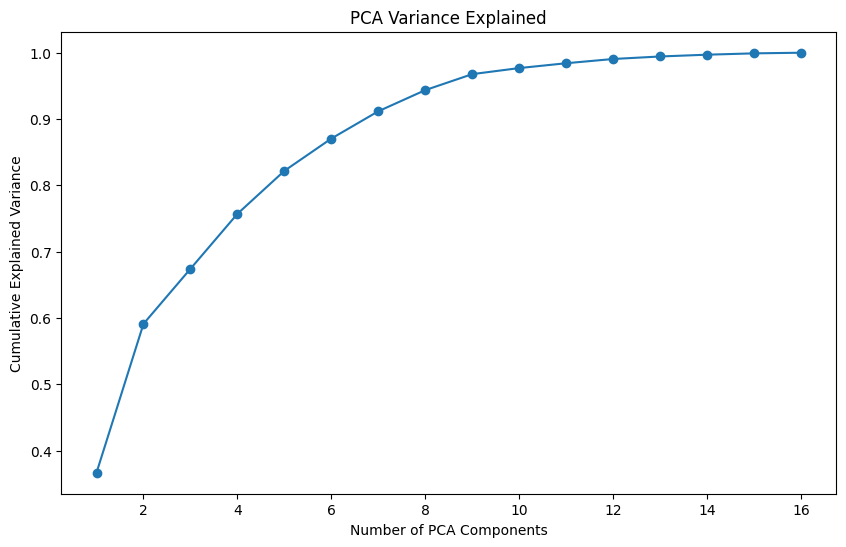

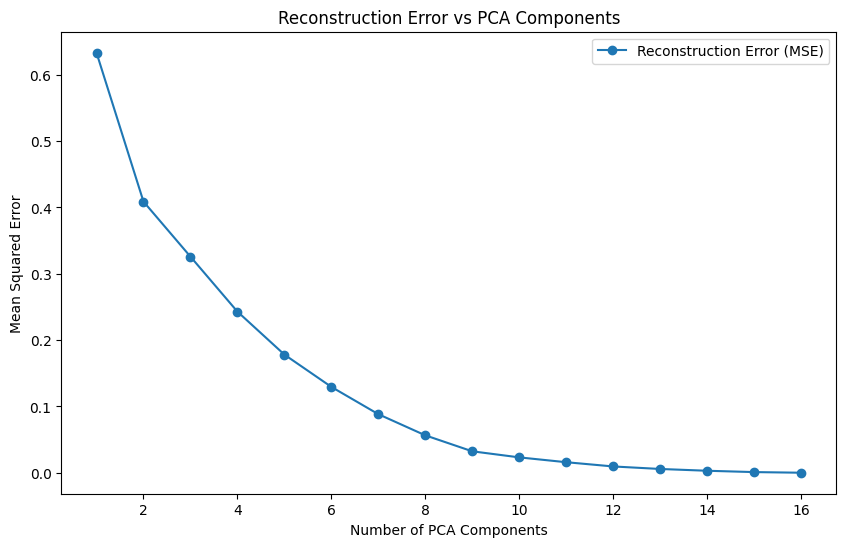

Reconstruction Errors:
    n_components           mse
0              1  6.332518e-01
1              2  4.088039e-01
2              3  3.258245e-01
3              4  2.429234e-01
4              5  1.781102e-01
5              6  1.294087e-01
6              7  8.826398e-02
7              8  5.637242e-02
8              9  3.228220e-02
9             10  2.314168e-02
10            11  1.584359e-02
11            12  9.454177e-03
12            13  5.659285e-03
13            14  2.966282e-03
14            15  9.563141e-04
15            16  1.295299e-30


In [138]:
# Generated from [7]
# Normalize data
scaler = StandardScaler()
normalized_data = scaler.fit_transform(transformed_data)

# Train PCA
pca = PCA()
pca.fit(normalized_data)

# Plot variance explained
explained_variance = np.cumsum(pca.explained_variance_ratio_)
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o')
plt.xlabel('Number of PCA Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Variance Explained')
plt.show()

# Reconstruct data using varying PCA dimensions
max_components = min(25, normalized_data.shape[1])  # Limit to 25 or total features
mse_list = []

for n_components in range(1, max_components + 1):
    pca = PCA(n_components=n_components)
    reduced_data = pca.fit_transform(normalized_data)
    reconstructed_data = pca.inverse_transform(reduced_data)
    mse = mean_squared_error(normalized_data, reconstructed_data)
    mse_list.append({'n_components': n_components, 'mse': mse})

# Convert MSE results to a DataFrame
mse_df = pd.DataFrame(mse_list)

# Plot MSE against the number of components
plt.figure(figsize=(10, 6))
plt.plot(mse_df['n_components'], mse_df['mse'], marker='o', label='Reconstruction Error (MSE)')
plt.xlabel('Number of PCA Components')
plt.ylabel('Mean Squared Error')
plt.title('Reconstruction Error vs PCA Components')
plt.legend()
plt.show()

# Display the results
print("Reconstruction Errors:")
print(mse_df)


## Attributions

0. ChatGPT prompt  
   Add docstrings and necessary comments to this code-block. Suggest any changes or mistakes that you observe in the code too. Summarize the code-block in a explanation, that I need as MD
1. ChatGPT prompt  
Provide me with descriptions of why I am using the following libraries in my data analysis assignment, in Markdown:
1. ChatGPT prompt:  
   What pre-processing should be done here?
2. ChatGPT prompt:  
   How can I apply normalizing transforms to the data here.
2. ChatGPT prompt:  
   How to decide the optimal k value?
2. ChatGPT prompt:  
   I need to optimize this. Generate some simple code to loop through ranges of values.
2. ChatGPT prompt:  
   Having these many graphs makes it very difficult to analyze the output
3. ChatGPT prompt:  
   Perform PCA, analyze variance explained, compute reconstruction errors, and plot results
3. ChatGPT prompt:  
   Here are the column statistics per cluster. For both label types, how would you describle the cluster members? Keep it to 1-2 lines.